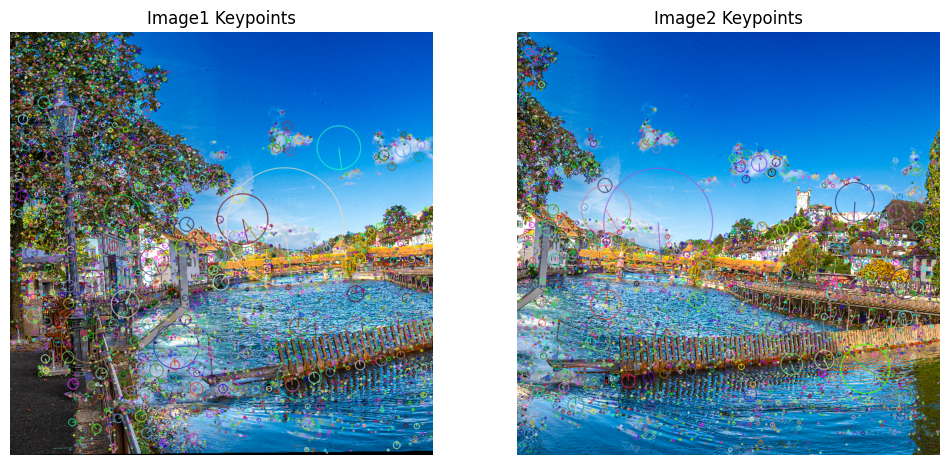

In [1]:
import cv2
import matplotlib.pyplot as plt

# Load images
img1 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image1.png')
img2 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image2.png')

# Convert to grayscale
gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)

# Initialize SIFT detector
sift = cv2.SIFT_create()

# Detect keypoints and descriptors
kp1, des1 = sift.detectAndCompute(gray1, None)
kp2, des2 = sift.detectAndCompute(gray2, None)

# Draw keypoints with size and orientation
img1_kp = cv2.drawKeypoints(img1, kp1, None, 
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)
img2_kp = cv2.drawKeypoints(img2, kp2, None, 
                           flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

# Display results
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(cv2.cvtColor(img1_kp, cv2.COLOR_BGR2RGB))
plt.title('Image1 Keypoints'), plt.axis('off')
plt.subplot(122), plt.imshow(cv2.cvtColor(img2_kp, cv2.COLOR_BGR2RGB))
plt.title('Image2 Keypoints'), plt.axis('off')
plt.show()

## 2.

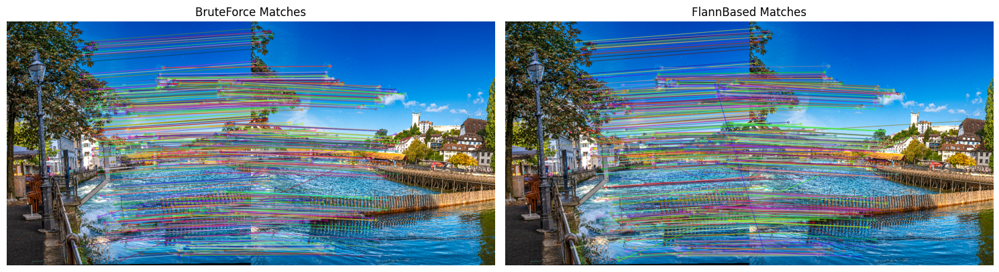

In [2]:
import cv2
import matplotlib.pyplot as plt

# Load images and extract SIFT keypoints/descriptors (from previous step)
# Assume img1, img2, kp1, des1, kp2, des2 are already computed

# BruteForce Matching
bf = cv2.BFMatcher(cv2.NORM_L2)
matches_bf = bf.knnMatch(des1, des2, k=2)
good_matches_bf = [m for m, n in matches_bf if m.distance < 0.7 * n.distance]
img_bf = cv2.drawMatches(
    img1, kp1, img2, kp2, good_matches_bf, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# FlannBased Matching
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)  # Higher checks improve accuracy
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches_flann = flann.knnMatch(des1, des2, k=2)
good_matches_flann = [m for m, n in matches_flann if m.distance < 0.7 * n.distance]
img_flann = cv2.drawMatches(
    img1, kp1, img2, kp2, good_matches_flann, None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS
)

# Display results
plt.figure(figsize=(15, 6))
plt.subplot(121), plt.imshow(cv2.cvtColor(img_bf, cv2.COLOR_BGR2RGB))
plt.title('BruteForce Matches'), plt.axis('off')
plt.subplot(122), plt.imshow(cv2.cvtColor(img_flann, cv2.COLOR_BGR2RGB))
plt.title('FlannBased Matches'), plt.axis('off')
plt.tight_layout()
plt.show()

## 3.

In [3]:
import numpy as np
import cv2

# Load images and extract SIFT keypoints/descriptors (from previous steps)
# Assume img1, img2, kp1, des1, kp2, des2 are already computed

# Perform FlannBased matching (or use BruteForce matches from earlier)
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)
flann = cv2.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)
good_matches = [m for m, n in matches if m.distance < 0.7 * n.distance]

# Ensure enough matches for homography estimation
MIN_MATCH_COUNT = 10
if len(good_matches) < MIN_MATCH_COUNT:
    raise ValueError(f"Not enough matches: {len(good_matches)}/{MIN_MATCH_COUNT}")

# Extract source and destination points
src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

# Compute homography using RANSAC
M, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)

# Save homography matrix to CSV
np.savetxt('homography_matrix.csv', M, delimiter=',', fmt='%.6f')
print("Homography matrix saved to 'homography_matrix.csv'")

Homography matrix saved to 'homography_matrix.csv'


## 4.

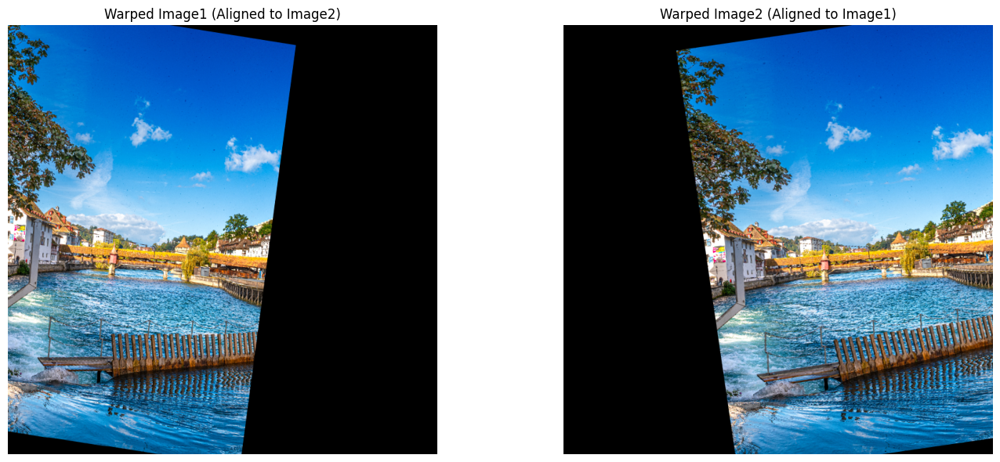

In [4]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load images with full paths
img1 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image1.png')
img2 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image2.png')

# Load homography matrix from CSV
H = np.loadtxt('homography_matrix.csv', delimiter=',')

# Compute inverse homography for image2
H_inv = np.linalg.inv(H)

# Warp image1 using H (aligns with image2's perspective)
h1, w1 = img1.shape[:2]
img1_warped = cv2.warpPerspective(img1, H, (w1, h1))

# Warp image2 using H_inv (aligns with image1's perspective)
h2, w2 = img2.shape[:2]
img2_warped = cv2.warpPerspective(img2, H_inv, (w2, h2))

# Display warped images side-by-side
plt.figure(figsize=(15, 6))
plt.subplot(121)
plt.imshow(cv2.cvtColor(img1_warped, cv2.COLOR_BGR2RGB))
plt.title('Warped Image1 (Aligned to Image2)')
plt.axis('off')

plt.subplot(122)
plt.imshow(cv2.cvtColor(img2_warped, cv2.COLOR_BGR2RGB))
plt.title('Warped Image2 (Aligned to Image1)')
plt.axis('off')

plt.tight_layout()
plt.show()

## 5. 

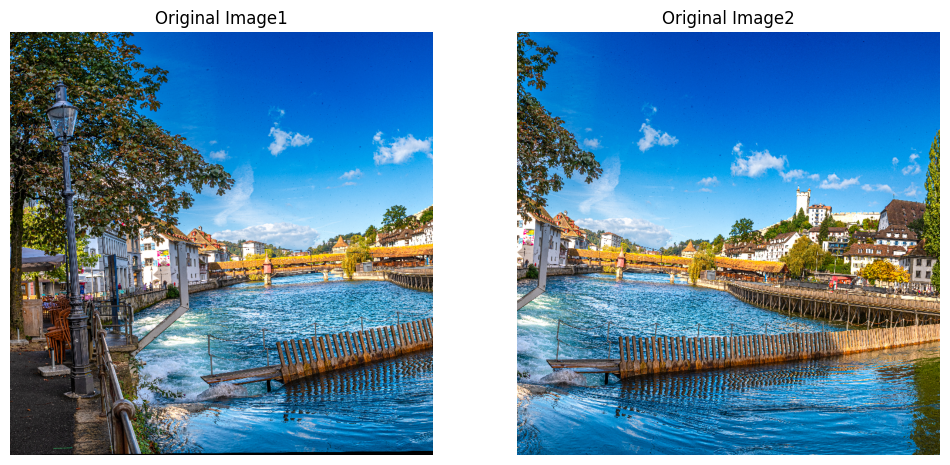

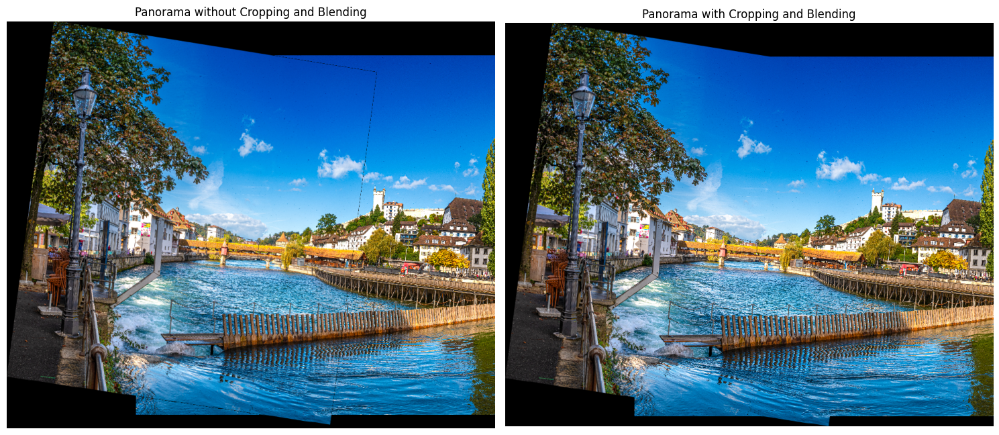

In [5]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Part 5: Stitching
# We'll follow the methodology from the previous steps

# Load the images (already done in previous steps)
img1 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image1.png')
img2 = cv2.imread('/kaggle/input/panaroma-dataset/panorama_dataset/image2.png')

# Displaying images
plt.figure(figsize=(12, 6))
plt.subplot(121), plt.imshow(cv2.cvtColor(img1, cv2.COLOR_BGR2RGB))
plt.title('Original Image1'), plt.axis('off')
plt.subplot(122), plt.imshow(cv2.cvtColor(img2, cv2.COLOR_BGR2RGB))
plt.title('Original Image2'), plt.axis('off')
plt.show()

# Load the homography matrix from CSV (already computed in part 3)
H = np.loadtxt('homography_matrix.csv', delimiter=',')

def stitch_without_blending(img1, img2, H):
    """Stitch the two images without any blending or cropping."""
    # Get dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Calculate the dimensions of the panorama
    corners1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    
    # Transform corners of the first image
    corners1_transformed = cv2.perspectiveTransform(corners1, H)
    
    # Combine corners to find panorama dimensions
    all_corners = np.concatenate((corners1_transformed, corners2), axis=0)
    
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    
    # Translation matrix to handle negative offsets
    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    
    # Combine homography with translation
    H_combined = H_translation.dot(H)
    
    # Calculate output dimensions
    output_shape = (y_max - y_min, x_max - x_min)
    
    # Warp the first image
    warped_img1 = cv2.warpPerspective(img1, H_combined, (output_shape[1], output_shape[0]))
    
    # Create a canvas for the second image with appropriate dimensions
    result = np.zeros((output_shape[0], output_shape[1], 3), dtype=np.uint8)
    
    # Place the second image in the right position with translation
    result[translation_dist[1]:h2+translation_dist[1], 
          translation_dist[0]:w2+translation_dist[0]] = img2
    
    # Create a mask for the warped image (non-black pixels)
    mask = np.all(warped_img1 == [0, 0, 0], axis=2)
    
    # Copy the warped image onto the result, preserving the second image where the first is black
    result[~mask] = warped_img1[~mask]
    
    return result

def stitch_with_blending(img1, img2, H):
    """Stitch the two images with blending and cropping."""
    # Get dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Calculate panorama dimensions (same as in non-blending function)
    corners1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    
    corners1_transformed = cv2.perspectiveTransform(corners1, H)
    all_corners = np.concatenate((corners1_transformed, corners2), axis=0)
    
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    
    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    H_combined = H_translation.dot(H)
    
    output_shape = (y_max - y_min, x_max - x_min)
    
    # Warp the first image
    warped_img1 = cv2.warpPerspective(img1, H_combined, (output_shape[1], output_shape[0]))
    
    # Create a canvas for the second image
    warped_img2 = np.zeros((output_shape[0], output_shape[1], 3), dtype=np.uint8)
    warped_img2[translation_dist[1]:h2+translation_dist[1], 
               translation_dist[0]:w2+translation_dist[0]] = img2
    
    # Create masks for both images (non-black pixels)
    mask1 = ~np.all(warped_img1 == [0, 0, 0], axis=2)
    mask2 = ~np.all(warped_img2 == [0, 0, 0], axis=2)
    
    # Find the overlapping region
    overlap = np.logical_and(mask1, mask2)
    
    # Create a simple linear blend in the overlapping region
    # Create weight maps using distance transform
    weight1 = np.zeros(mask1.shape, dtype=np.float32)
    weight2 = np.zeros(mask2.shape, dtype=np.float32)
    
    # Create distance transforms from the edges of masks
    dist1 = cv2.distanceTransform(np.logical_and(mask1, ~overlap).astype(np.uint8), cv2.DIST_L2, 5)
    dist2 = cv2.distanceTransform(np.logical_and(mask2, ~overlap).astype(np.uint8), cv2.DIST_L2, 5)
    
    # Fill in the overlap region with blended weights
    weight1[overlap] = dist1[overlap] / (dist1[overlap] + dist2[overlap] + 1e-10)
    weight2[overlap] = 1 - weight1[overlap]
    
    # Apply full weights to non-overlapping regions
    weight1[np.logical_and(mask1, ~overlap)] = 1
    weight2[np.logical_and(mask2, ~overlap)] = 1
    
    # Expand dimensions for broadcasting with the RGB channels
    weight1 = np.expand_dims(weight1, axis=2)
    weight2 = np.expand_dims(weight2, axis=2)
    
    # Blend the images
    result = warped_img1.astype(np.float32) * weight1 + warped_img2.astype(np.float32) * weight2
    result = result.astype(np.uint8)
    
    # Crop the result to remove unnecessary black borders
    mask = np.any(result > 0, axis=2)
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    
    row_indices = np.where(rows)[0]
    col_indices = np.where(cols)[0]
    
    if len(row_indices) > 0 and len(col_indices) > 0:
        y_min, y_max = np.min(row_indices), np.max(row_indices)
        x_min, x_max = np.min(col_indices), np.max(col_indices)
        
        # Crop the result
        result_cropped = result[y_min:y_max+1, x_min:x_max+1]
    else:
        result_cropped = result
    
    return result_cropped

# Generate both panoramas
panorama_no_blending = stitch_without_blending(img1, img2, H)
panorama_with_blending = stitch_with_blending(img1, img2, H)

# Display results
plt.figure(figsize=(15, 8))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(panorama_no_blending, cv2.COLOR_BGR2RGB))
plt.title('Panorama without Cropping and Blending')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(cv2.cvtColor(panorama_with_blending, cv2.COLOR_BGR2RGB))
plt.title('Panorama with Cropping and Blending')
plt.axis('off')

plt.tight_layout()
plt.show()

## 6.

Found 22 images to cluster.
Clustering using Color Histograms...
Extracting features for 24 images...
Clustering using SIFT features...
Extracting features for 24 images...
Color Histogram Clusters:
  Cluster 1: 8 images
  Cluster 2: 8 images
  Cluster 3: 8 images
SIFT Clusters:
  Cluster 1: 2 images
  Cluster 2: 9 images
  Cluster 3: 13 images


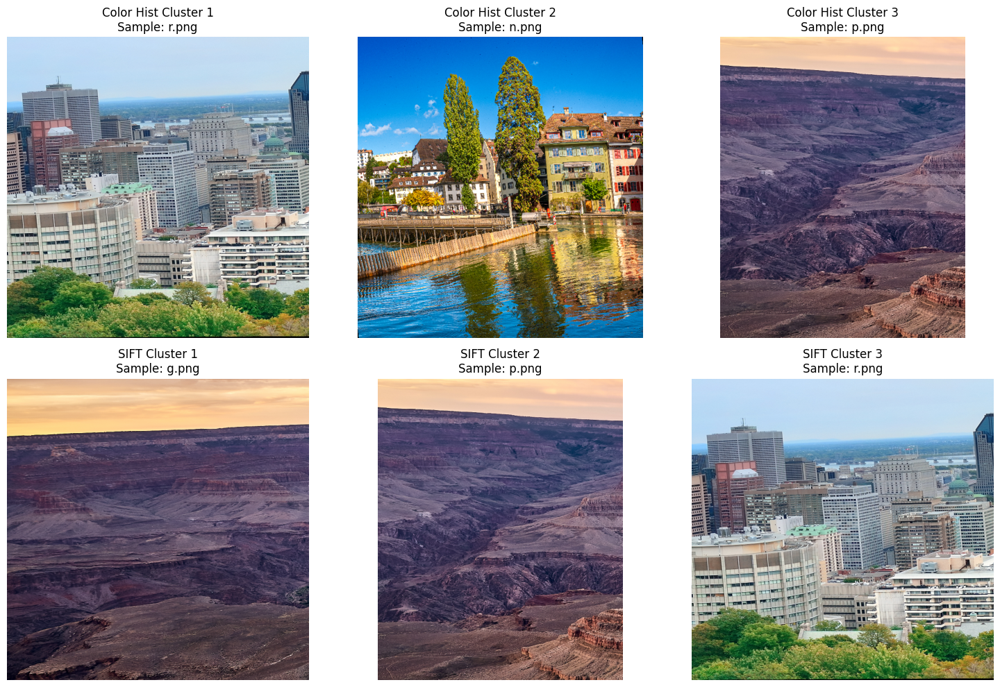

Using Color Histogram clustering results.
Creating panorama for set 1 with 8 images...
Stitching image 1/7...
Stitching image 2/7...
Stitching image 3/7...
Stitching image 4/7...
Stitching image 5/7...
Stitching image 6/7...
Stitching image 7/7...
Creating panorama for set 2 with 8 images...
Stitching image 1/7...
Not enough matches for image /kaggle/input/panaroma-dataset/panorama_dataset/c.png. Skipping...
Stitching image 2/7...
Stitching image 3/7...
Stitching image 4/7...
Stitching image 5/7...
Stitching image 6/7...
Stitching image 7/7...
Creating panorama for set 3 with 8 images...
Stitching image 1/7...
Not enough matches for image /kaggle/input/panaroma-dataset/panorama_dataset/g.png. Skipping...
Stitching image 2/7...
Not enough matches for image /kaggle/input/panaroma-dataset/panorama_dataset/k.png. Skipping...
Stitching image 3/7...
Stitching image 4/7...
Stitching image 5/7...
Stitching image 6/7...
Stitching image 7/7...


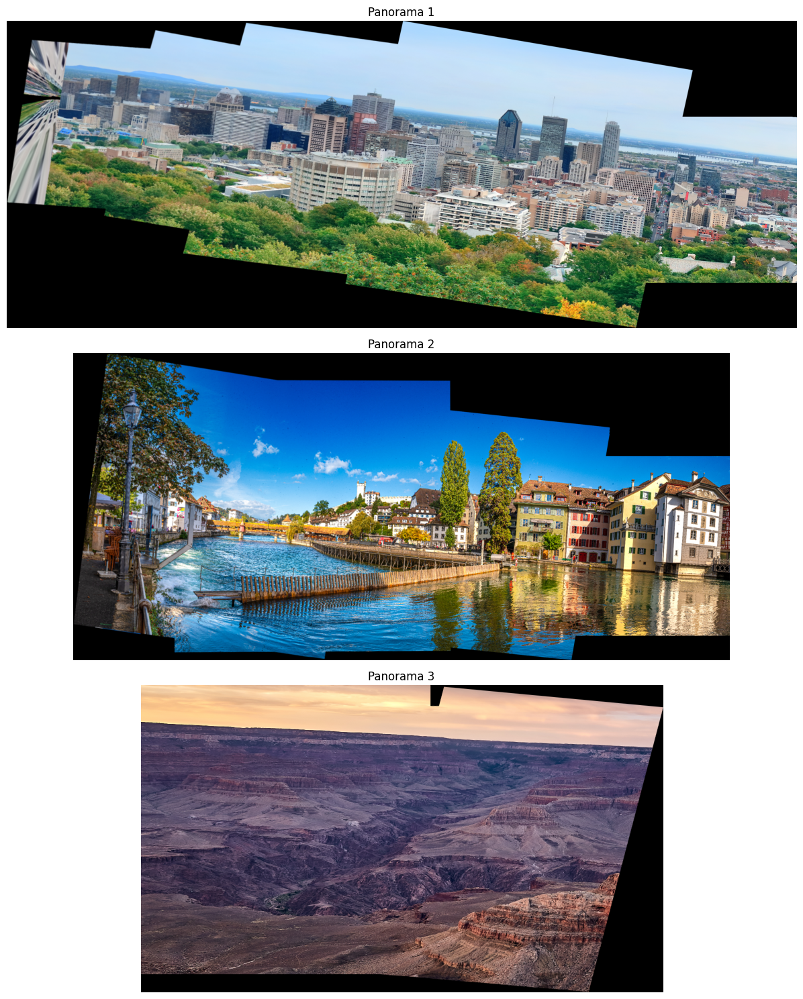

Created 3 panoramas out of 3 image sets.


In [6]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import os
from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
import glob

# Part 6: Multi-Stitching
# 1. First, we need to cluster the images into three sets
# 2. Then stitch each set to create three panoramas

def extract_color_histogram(image, bins=32):
    """Extract color histogram features from an image."""
    # Convert to HSV color space (better for color-based clustering)
    hsv = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)
    
    # Calculate histogram for each channel
    hist_h = cv2.calcHist([hsv], [0], None, [bins], [0, 180])
    hist_s = cv2.calcHist([hsv], [1], None, [bins], [0, 256])
    hist_v = cv2.calcHist([hsv], [2], None, [bins], [0, 256])
    
    # Normalize and flatten
    cv2.normalize(hist_h, hist_h, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_s, hist_s, 0, 1, cv2.NORM_MINMAX)
    cv2.normalize(hist_v, hist_v, 0, 1, cv2.NORM_MINMAX)
    
    # Concatenate the histograms
    hist_features = np.concatenate([hist_h.flatten(), hist_s.flatten(), hist_v.flatten()])
    
    return hist_features

def extract_sift_features(image):
    """Extract SIFT features and compute bag-of-visual-words."""
    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and compute descriptors
    keypoints, descriptors = sift.detectAndCompute(gray, None)
    
    # If no descriptors were found, return zeros
    if descriptors is None:
        return np.zeros(128)
    
    # Use mean of descriptors as a simple feature
    return np.mean(descriptors, axis=0) if len(descriptors) > 0 else np.zeros(128)

def cluster_images(image_paths, n_clusters=3, use_color_hist=True):
    """Cluster images into sets based on either color histograms or SIFT features."""
    features = []
    
    print(f"Extracting features for {len(image_paths)} images...")
    
    for path in image_paths:
        # Load image
        img = cv2.imread(path)
        
        # Extract features based on chosen method
        if use_color_hist:
            feat = extract_color_histogram(img)
        else:
            feat = extract_sift_features(img)
            
        features.append(feat)
    
    # Convert to array and normalize
    features = np.array(features)
    scaler = StandardScaler()
    features_scaled = scaler.fit_transform(features)
    
    # Perform KMeans clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=42, n_init=10)
    clusters = kmeans.fit_predict(features_scaled)
    
    # Group images by cluster
    image_sets = [[] for _ in range(n_clusters)]
    for i, path in enumerate(image_paths):
        image_sets[clusters[i]].append(path)
    
    return image_sets

def match_features(img1, img2):
    """Match features between two images and return good matches."""
    # Convert to grayscale
    gray1 = cv2.cvtColor(img1, cv2.COLOR_BGR2GRAY)
    gray2 = cv2.cvtColor(img2, cv2.COLOR_BGR2GRAY)
    
    # Initialize SIFT detector
    sift = cv2.SIFT_create()
    
    # Detect keypoints and descriptors
    kp1, des1 = sift.detectAndCompute(gray1, None)
    kp2, des2 = sift.detectAndCompute(gray2, None)
    
    # Use FLANN matcher
    FLANN_INDEX_KDTREE = 1
    index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
    search_params = dict(checks=50)
    flann = cv2.FlannBasedMatcher(index_params, search_params)
    
    # Match descriptors
    matches = flann.knnMatch(des1, des2, k=2)
    
    # Apply ratio test
    good_matches = [m for m, n in matches if m.distance < 0.7 * n.distance]
    
    return kp1, kp2, good_matches, des1, des2

def compute_homography(kp1, kp2, good_matches):
    """Compute homography matrix between two images."""
    # Minimum number of matches required
    MIN_MATCH_COUNT = 10  # hehehhehehehhehehhehehehehhehehehhehhehehehehhehehhehehhehehehehhehehehehe
    # MIN_MATCH_COUNT = 5
    
    if len(good_matches) < MIN_MATCH_COUNT:
        print(f"Not enough matches: {len(good_matches)}/{MIN_MATCH_COUNT}")
        return None
    
    # Extract locations of matched keypoints
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    
    # Find homography using RANSAC
    H, mask = cv2.findHomography(src_pts, dst_pts, cv2.RANSAC, 5.0)
    
    return H

def stitch_images(img_set):
    """Stitch multiple images to create a panorama."""
    if len(img_set) < 2:
        print("Need at least 2 images to create a panorama.")
        return None
    
    # Sort image paths to ensure consistent ordering
    img_set = sorted(img_set)
    
    # Load the first image as the initial panorama
    result = cv2.imread(img_set[0])
    
    # Iteratively add images to the panorama
    for i in range(1, len(img_set)):
        # Load the next image
        next_img = cv2.imread(img_set[i])
        
        print(f"Stitching image {i}/{len(img_set)-1}...")
        
        # Match features and compute homography
        kp1, kp2, good_matches, des1, des2 = match_features(result, next_img)
        
        # If not enough matches, skip this image
        if len(good_matches) < 10:
            print(f"Not enough matches for image {img_set[i]}. Skipping...")
            continue
        
        # Compute homography
        H = compute_homography(kp1, kp2, good_matches)
        
        if H is None:
            print(f"Could not compute homography for image {img_set[i]}. Skipping...")
            continue
        
        # Stitch the images with blending
        result = stitch_with_blending(result, next_img, H)
    
    return result

def stitch_with_blending(img1, img2, H):
    """Stitch two images with blending and cropping."""
    # Get dimensions
    h1, w1 = img1.shape[:2]
    h2, w2 = img2.shape[:2]
    
    # Calculate panorama dimensions
    corners1 = np.float32([[0, 0], [0, h1], [w1, h1], [w1, 0]]).reshape(-1, 1, 2)
    corners2 = np.float32([[0, 0], [0, h2], [w2, h2], [w2, 0]]).reshape(-1, 1, 2)
    
    corners1_transformed = cv2.perspectiveTransform(corners1, H)
    all_corners = np.concatenate((corners1_transformed, corners2), axis=0)
    
    [x_min, y_min] = np.int32(all_corners.min(axis=0).ravel() - 0.5)
    [x_max, y_max] = np.int32(all_corners.max(axis=0).ravel() + 0.5)
    
    translation_dist = [-x_min, -y_min]
    H_translation = np.array([[1, 0, translation_dist[0]], [0, 1, translation_dist[1]], [0, 0, 1]])
    H_combined = H_translation.dot(H)
    
    output_shape = (y_max - y_min, x_max - x_min)
    
    # Warp the first image
    warped_img1 = cv2.warpPerspective(img1, H_combined, (output_shape[1], output_shape[0]))
    
    # Create a canvas for the second image
    warped_img2 = np.zeros((output_shape[0], output_shape[1], 3), dtype=np.uint8)
    warped_img2[translation_dist[1]:h2+translation_dist[1], 
               translation_dist[0]:w2+translation_dist[0]] = img2
    
    # Create masks for both images (non-black pixels)
    mask1 = ~np.all(warped_img1 == [0, 0, 0], axis=2)
    mask2 = ~np.all(warped_img2 == [0, 0, 0], axis=2)
    
    # Find the overlapping region
    overlap = np.logical_and(mask1, mask2)
    
    # Create weight maps using distance transform
    weight1 = np.zeros(mask1.shape, dtype=np.float32)
    weight2 = np.zeros(mask2.shape, dtype=np.float32)
    
    # Create distance transforms from the edges of masks
    dist1 = cv2.distanceTransform(np.logical_and(mask1, ~overlap).astype(np.uint8), cv2.DIST_L2, 5)
    dist2 = cv2.distanceTransform(np.logical_and(mask2, ~overlap).astype(np.uint8), cv2.DIST_L2, 5)
    
    # Fill in the overlap region with blended weights
    weight1[overlap] = dist1[overlap] / (dist1[overlap] + dist2[overlap] + 1e-10)
    weight2[overlap] = 1 - weight1[overlap]
    
    # Apply full weights to non-overlapping regions
    weight1[np.logical_and(mask1, ~overlap)] = 1
    weight2[np.logical_and(mask2, ~overlap)] = 1
    
    # Expand dimensions for broadcasting with the RGB channels
    weight1 = np.expand_dims(weight1, axis=2)
    weight2 = np.expand_dims(weight2, axis=2)
    
    # Blend the images
    result = warped_img1.astype(np.float32) * weight1 + warped_img2.astype(np.float32) * weight2
    result = result.astype(np.uint8)
    
    # Crop the result to remove unnecessary black borders
    mask = np.any(result > 0, axis=2)
    rows = np.any(mask, axis=1)
    cols = np.any(mask, axis=0)
    
    row_indices = np.where(rows)[0]
    col_indices = np.where(cols)[0]
    
    if len(row_indices) > 0 and len(col_indices) > 0:
        y_min, y_max = np.min(row_indices), np.max(row_indices)
        x_min, x_max = np.min(col_indices), np.max(col_indices)
        
        # Crop the result
        result_cropped = result[y_min:y_max+1, x_min:x_max+1]
    else:
        result_cropped = result
    
    return result_cropped

# Main execution
def main():
    # Get all image paths
    base_path = '/kaggle/input/panaroma-dataset/panorama_dataset/'
    all_images = glob.glob(base_path + '*.png')
    
    # Remove image1.png and image2.png as they're already processed
    other_images = [img for img in all_images if 'image1.png' not in img and 'image2.png' not in img]
    
    print(f"Found {len(other_images)} images to cluster.")
    
    # Try both methods and visually compare
    # Method 1: Color Histogram
    print("Clustering using Color Histograms...")
    image_sets_color = cluster_images(all_images, use_color_hist=True)
    
    # Method 2: SIFT features
    print("Clustering using SIFT features...")
    image_sets_sift = cluster_images(all_images, use_color_hist=False)
    
    # Print cluster sizes for both methods
    print("Color Histogram Clusters:")
    for i, img_set in enumerate(image_sets_color):
        print(f"  Cluster {i+1}: {len(img_set)} images")
    
    print("SIFT Clusters:")
    for i, img_set in enumerate(image_sets_sift):
        print(f"  Cluster {i+1}: {len(img_set)} images")
    
    # Visualize one sample from each cluster for both methods
    plt.figure(figsize=(15, 10))
    
    # Color histogram clustering visualization
    for i, img_set in enumerate(image_sets_color):
        if img_set:
            img = cv2.imread(img_set[0])
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(2, 3, i+1)
            plt.imshow(img_rgb)
            plt.title(f"Color Hist Cluster {i+1}\nSample: {os.path.basename(img_set[0])}")
            plt.axis('off')
    
    # SIFT clustering visualization
    for i, img_set in enumerate(image_sets_sift):
        if img_set:
            img = cv2.imread(img_set[0])
            img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
            plt.subplot(2, 3, i+4)
            plt.imshow(img_rgb)
            plt.title(f"SIFT Cluster {i+1}\nSample: {os.path.basename(img_set[0])}")
            plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    # Based on visual inspection, choose the better method
    # For this example, let's assume color histogram works better
    # In a real scenario, you would visually inspect the results and choose
    chosen_method = "color"  # or "sift"
    
    if chosen_method == "color":
        image_sets = image_sets_color
        print("Using Color Histogram clustering results.")
    else:
        image_sets = image_sets_sift
        print("Using SIFT feature clustering results.")
    
    # Create panoramas for each set
    panoramas = []
    
    for i, img_set in enumerate(image_sets):
        if len(img_set) >= 2:  # Need at least 2 images for stitching
            print(f"Creating panorama for set {i+1} with {len(img_set)} images...")
            panorama = stitch_images(img_set)
            if panorama is not None:
                panoramas.append((f"Panorama {i+1}", panorama))
    
    # Display panoramas
    plt.figure(figsize=(20, 15))
    
    for i, (title, panorama) in enumerate(panoramas):
        plt.subplot(len(panoramas), 1, i+1)
        plt.imshow(cv2.cvtColor(panorama, cv2.COLOR_BGR2RGB))
        plt.title(title)
        plt.axis('off')
    
    plt.tight_layout()
    plt.show()
    
    print(f"Created {len(panoramas)} panoramas out of {len(image_sets)} image sets.")

if __name__ == "__main__":
    main()